# Visium-HD Landscape Pre-Processing 

In [1]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [2]:
import os
import tarfile
import json
from pathlib import Path
from datetime import date
from collections import defaultdict

import numpy as np
import pandas as pd
import polars as pl
import h5py

import scanpy as sc
import celldega as dega

import tifffile
import fiona
import geopandas as gpd

from glob import glob
from matplotlib import pyplot as plt
from matplotlib.colors import to_hex

from shapely.geometry import Polygon, Point, shape
from scipy.sparse import coo_matrix, csr_matrix, issparse

from ipywidgets import Widget

print(f"Celldega Version: {dega.__version__}")

Celldega Version: 0.13.0


In [3]:
today = date.today()

In [4]:
technology = "Xenium"

path_data = 'data' 
dataset_name = 'visium_hd_mouse_brain'

bin_size = 2
jitter = 2

image_file_name = 'sample_data_Visium_HD_Mouse_Brain_tissue_image.tif'

path_landscape_files=f'data/landscape_files/{dataset_name}_{today}_{bin_size}um'

image_tile_layer='h&e'
image_scale = 1.0
suffix = '.webp[Q=100]'

tile_size = 500
max_tiles_to_view = 5

### Make Landscape Files directory

In [5]:
os.makedirs(path_landscape_files, exist_ok=True)

### Decompress all .tar.gz files in raw data

In [6]:
def decompress_all_tar_gz(path):
    for file in os.listdir(path):
        if file.endswith(".tar.gz"):
            file_path = os.path.join(path, file)
            print(f"Decompressing: {file}")
            with tarfile.open(file_path, "r:gz") as tar:
                tar.extractall(path)
    print("All files decompressed.")

decompress_all_tar_gz(f"{path_data}/{dataset_name}")

Decompressing: binned_outputs.tar.gz


/var/folders/_6/bhs42vt57t1dkb59k4sy0p440000gp/T/ipykernel_42343/1217129229.py:7: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path)


Decompressing: spatial.tar.gz
Decompressing: segmented_outputs.tar.gz
All files decompressed.


# Process Image

In [7]:
# Path to your OME-TIFF file
file_path = f"{path_data}/{dataset_name}/{image_file_name}"


# Open the OME-TIFF file and read the image data
with tifffile.TiffFile(file_path) as tif:
    series = tif.series[0]
    image_data = series.asarray()

# Save the image data to a regular TIFF file without compression
tifffile.imwrite(path_landscape_files + '/output_regular.tif', image_data, compression=None)
image_png = dega.pre._convert_to_png(path_landscape_files + '/output_regular.tif')
dega.pre.make_deepzoom_pyramid(image_png,
                               path_landscape_files + '/pyramid_images/', image_tile_layer, tile_size=tile_size, suffix=suffix)    

In [8]:
tile_bounds = {}
tile_bounds["x_min"] = 0
tile_bounds["x_max"] = image_data.shape[1]
tile_bounds["y_min"] = 0
tile_bounds["y_max"] = image_data.shape[0]

# Process Cells

### Note: Cells are in pixel/ image space and are already aligned with the Microscope Image

In [9]:
features = []
with fiona.open(f"{path_data}/{dataset_name}/segmented_outputs/cell_segmentations.geojson") as src:
    for feat in src:
        features.append({"geometry": shape(feat["geometry"]),
                         "cell_id": feat["properties"]['cell_id']})

cells = gpd.GeoDataFrame(features)

In [10]:
cells['centroid_x'] = cells.geometry.centroid.x
cells['centroid_y'] = cells.geometry.centroid.y

cells["geometry_point"] = cells.apply(lambda row: Point(row["centroid_x"], row["centroid_y"]), axis=1)
cells["cell_id"] = cells["cell_id"].astype(str).map(lambda x: f"c-{x}")
cells.head()

,geometry,cell_id,centroid_x,centroid_y,geometry_point
0,"POLYGON ((1114.300 3427.700, 1114.400 3435.000...",c-1,1108.803850,3465.534372,POINT (1108.804 3465.534)
1,"POLYGON ((6725.200 3240.900, 6725.300 3248.200...",c-2,6729.776392,3291.966229,POINT (6729.776 3291.966)
2,"POLYGON ((5798.400 3743.900, 5798.500 3751.200...",c-3,5789.477033,3776.779275,POINT (5789.477 3776.779)
3,"POLYGON ((5804.200 3649.000, 5804.300 3656.300...",c-4,5805.241248,3683.451325,POINT (5805.241 3683.451)
4,"POLYGON ((6018.900 2879.200, 6019.000 2886.500...",c-5,6013.369223,2914.734208,POINT (6013.369 2914.734)


In [11]:
cell_metadata = gpd.GeoDataFrame(cells[["cell_id", "geometry_point"]], geometry="geometry_point", crs="EPSG:4326")

cell_metadata['geometry'] = cell_metadata["geometry_point"].apply(lambda p: [round(p.x, 2), round(p.y, 2)])
cell_metadata.drop("geometry_point", axis=1, inplace=True)
cell_metadata.rename(columns={"geometry_point":"geometry", 
                              "cell_id":"name"}, inplace=True)

cell_metadata.to_parquet(path_landscape_files + '/cell_metadata.parquet')
cell_metadata.head()

,name,geometry
0,c-1,"[1108.8, 3465.53]"
1,c-2,"[6729.78, 3291.97]"
2,c-3,"[5789.48, 3776.78]"
3,c-4,"[5805.24, 3683.45]"
4,c-5,"[6013.37, 2914.73]"


In [12]:
output_dir = Path(path_landscape_files + '/cell_clusters')
output_dir.mkdir(parents=True, exist_ok=True)

### Saving dummy clusters...

In [13]:
# def_clusters = pd.DataFrame(index=cells.index.tolist())
# def_clusters['cluster'] = pd.Series(0, index=cells.index.tolist())

In [14]:
# def_clusters.to_parquet(path_landscape_files + '/cell_clusters/cluster.parquet')

In [15]:
# meta_cluster = pd.DataFrame()
# meta_cluster.loc['0', 'color'] = '#ff7f0e'
# meta_cluster.loc['0', 'count'] = 1000
# meta_cluster.to_parquet(path_landscape_files + '/cell_clusters/meta_cluster.parquet')

### Saving default clusters...

In [16]:
def_clusters = pd.read_csv(
    f"{path_data}/{dataset_name}/segmented_outputs/analysis/clustering/gene_expression_graphclust/clusters.csv"
)

def_clusters.index = def_clusters['Barcode'].str.extract(r"cellid_0*(\d+)-")[0] \
    .astype(int).astype(str) \
    .map(lambda x: f"c-{x}")

def_clusters.drop("Barcode", axis=1, inplace=True)
def_clusters.rename(columns={'Cluster':"cluster"}, inplace=True)
def_clusters['cluster'] = def_clusters['cluster'].astype(str)
def_clusters.index.name = ""

def_clusters.to_parquet(path_landscape_files + '/cell_clusters/cluster.parquet')

In [17]:
meta_cluster = def_clusters["cluster"].value_counts().to_frame(name="count")
cmap = plt.cm.get_cmap("tab10")

n_colors = cmap.N
meta_cluster["color"] = [
    plt.cm.colors.to_hex(cmap(i % n_colors)) for i in range(len(meta_cluster))
]
meta_cluster = meta_cluster[["color", "count"]]
meta_cluster.index = meta_cluster.index.astype("string")
meta_cluster.index.name = "__index_level_0__"
meta_cluster.to_parquet(path_landscape_files + '/cell_clusters/meta_cluster.parquet')
meta_cluster.head()

/var/folders/_6/bhs42vt57t1dkb59k4sy0p440000gp/T/ipykernel_42343/3754381250.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab10")


,color,count
__index_level_0__,,
1,#1f77b4,9558
2,#ff7f0e,6171
3,#2ca02c,3552
4,#d62728,2683
5,#9467bd,1792


## Create cell tiles

In [18]:
def simple_format(geometry, image_scale):
    # factor in scaling
    return [[[coord[0] / image_scale, coord[1] / image_scale] for coord in polygon] for polygon in geometry]

In [19]:
def transform_polygon(polygon):

    exterior_coords = polygon.exterior.coords

    # Creating the original structure by directly using numpy array for each coordinate pair
    original_format_coords = np.array([np.array(coord) for coord in exterior_coords])

    return np.array([original_format_coords], dtype=object)

In [20]:
cells["GEOMETRY"] = cells["geometry"].apply(lambda poly: transform_polygon(poly))
cells["GEOMETRY"] = cells["GEOMETRY"].apply(lambda x: simple_format(x, image_scale))

In [21]:
cells.rename(columns={"cell_id":"name", 
                      "centroid_x":"center_x", 
                      "centroid_y":"center_y"}, inplace=True)

cells.drop(["geometry", "geometry_point"], axis=1, inplace=True)

In [22]:
cells.head()

,name,center_x,center_y,GEOMETRY
0,c-1,1108.803850,3465.534372,"[[[1114.3, 3427.7], [1114.4, 3435.0], [1129.0,..."
1,c-2,6729.776392,3291.966229,"[[[6725.2, 3240.9], [6725.3, 3248.2], [6754.5,..."
2,c-3,5789.477033,3776.779275,"[[[5798.4, 3743.9], [5798.5, 3751.2], [5813.1,..."
3,c-4,5805.241248,3683.451325,"[[[5804.2, 3649.0], [5804.3, 3656.3], [5811.6,..."
4,c-5,6013.369223,2914.734208,"[[[6018.9, 2879.2], [6019.0, 2886.5], [6026.3,..."


In [23]:
tile_size_x = tile_size
tile_size_y = tile_size

x_min = tile_bounds["x_min"]
x_max = tile_bounds["x_max"]
y_min = tile_bounds["y_min"]
y_max = tile_bounds["y_max"]

### Calculate the number of tiles needed

In [24]:
n_tiles_x = int(np.ceil((x_max - x_min) / tile_size_x))
n_tiles_y = int(np.ceil((y_max - y_min) / tile_size_y))

In [25]:
path_output = path_landscape_files + '/cell_segmentation'
os.makedirs(path_output, exist_ok=True)

In [26]:
for i in range(n_tiles_x):

    if i % 2 == 0:
        print('row', i)

    for j in range(n_tiles_y):
        tile_x_min = x_min + i * tile_size_x
        tile_x_max = tile_x_min + tile_size_x
        tile_y_min = y_min + j * tile_size_y
        tile_y_max = tile_y_min + tile_size_y

        # find cell polygons with centroids in the tile
        keep_cells = cells[
            (cells.center_x >= tile_x_min)
            & (cells.center_x < tile_x_max)
            & (cells.center_y >= tile_y_min)
            & (cells.center_y < tile_y_max)
        ].index.tolist()

        inst_geo = cells.loc[keep_cells, ["GEOMETRY"]]

        # try adding cell name to geometry
        inst_geo["name"] = pd.Series(
            inst_geo.index.tolist(), index=inst_geo.index.tolist()
        )

        filename = f"{path_output}/cell_tile_{i}_{j}.parquet"

        # Save the filtered DataFrame to a Parquet file
        if inst_geo.shape[0] > 0:
            inst_geo[["GEOMETRY", "name"]].to_parquet(filename)

row 0
row 2
row 4
row 6
row 8
row 10
row 12
row 14
row 16
row 18
row 20
row 22
row 24
row 26
row 28
row 30
row 32
row 34
row 36


## Process Meta Gene

In [27]:
adata_cell = sc.read_10x_h5(f"{path_data}/{dataset_name}/segmented_outputs/filtered_feature_cell_matrix.h5")

/Users/jishar/Documents/celldega/dega/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/jishar/Documents/celldega/dega/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [28]:
list_genes = adata_cell.var.index.tolist()
meta_gene = pd.DataFrame(index=list_genes)

palettes = [plt.get_cmap(name).colors for name in plt.colormaps() if "tab" in name]
flat_colors = [color for palette in palettes for color in palette]
flat_colors_hex = [to_hex(color) for color in flat_colors]

colors = [
    flat_colors_hex[i % len(flat_colors_hex)] if "Blank" not in gene else "#FFFFFF"
    for i, gene in enumerate(list_genes)
]

ser_color = pd.Series(colors, index=list_genes)

In [29]:
meta_gene['mean'] = pd.Series(100, index=list_genes)
meta_gene['std'] = pd.Series(10, index=list_genes)
meta_gene['max'] = pd.Series(100, index=list_genes)
meta_gene['non-zero'] = pd.Series(0.5, index=list_genes)
meta_gene['color'] = ser_color

meta_gene.to_parquet(path_landscape_files + '/meta_gene.parquet')

## Cell-by-gene (CBG)

In [30]:
cbg_df = dega.pre.read_cbg_mtx(f"{path_data}/{dataset_name}/segmented_outputs/filtered_feature_cell_matrix", 
             barcodes_name='barcodes', features_name='features', technology="Xenium")

In [31]:
cbg_df.index = cbg_df.index.str.extract(r"cellid_0*(\d+)-")[0] \
    .astype(int).astype(str) \
    .map(lambda x: f"c-{x}")
cbg_df.head()

__index_level_0__,Xkr4,Rp1,Sox17,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,Rb1cc1,...,mt-Atp8,mt-Atp6,mt-Co3,mt-Nd3,mt-Nd4l,mt-Nd4,mt-Nd5,mt-Nd6,mt-Cytb,Vamp7
0,,,,,,,,,,,,,,,,,,,,,
c-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
c-2,0,0,0,0,1,0,0,0,0,1,...,8,17,17,1,6,4,4,1,5,0
c-3,0,0,0,0,0,0,0,0,0,0,...,6,6,2,0,3,2,2,0,5,0
c-4,0,0,0,0,0,0,1,0,0,0,...,7,5,6,0,2,2,5,0,4,0
c-5,0,0,0,0,0,0,1,0,0,0,...,4,9,5,0,2,2,3,0,0,0


In [32]:
def make_column_names_unique_fast(df):
    counts = defaultdict(int)
    used = set()
    new_cols = []

    for col in df.columns:
        if col not in used:
            new_cols.append(col)
            used.add(col)
            counts[col] += 1
        else:
            while True:
                new_name = f"{col}_{counts[col]}"
                counts[col] += 1
                if new_name not in used:
                    new_cols.append(new_name)
                    used.add(new_name)
                    break

    df.columns = new_cols
    df = df.rename_axis("__index_level_0__", axis="columns")
    return df

In [33]:
cbg_df = make_column_names_unique_fast(cbg_df)

In [34]:
cbg_df.head()

__index_level_0__,Xkr4,Rp1,Sox17,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,Rb1cc1,...,mt-Atp8,mt-Atp6,mt-Co3,mt-Nd3,mt-Nd4l,mt-Nd4,mt-Nd5,mt-Nd6,mt-Cytb,Vamp7
0,,,,,,,,,,,,,,,,,,,,,
c-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
c-2,0,0,0,0,1,0,0,0,0,1,...,8,17,17,1,6,4,4,1,5,0
c-3,0,0,0,0,0,0,0,0,0,0,...,6,6,2,0,3,2,2,0,5,0
c-4,0,0,0,0,0,0,1,0,0,0,...,7,5,6,0,2,2,5,0,4,0
c-5,0,0,0,0,0,0,1,0,0,0,...,4,9,5,0,2,2,3,0,0,0


# Signatures

In [35]:
list_ser = []
clusters = def_clusters["cluster"].unique().tolist()
for inst_cat in clusters:
    if inst_cat is not None:
        inst_cells = def_clusters[def_clusters["cluster"] == inst_cat].index.tolist()
        if set(inst_cells) & set(cbg_df.index):
            common_cells = list(set(inst_cells) & set(cbg_df.index))
            inst_ser = cbg_df.loc[common_cells].sum() / len(common_cells)
        else:
            genes = cbg_df.columns
            inst_ser = pd.Series(0.0, index=genes)

        inst_ser.name = inst_cat
        list_ser.append(inst_ser)

In [39]:
# Combine the signatures into a DataFrame
df_sig = pd.concat(list_ser, axis=1)

# Handle potential multiindex issues
df_sig.columns = df_sig.columns.tolist()
df_sig.index = df_sig.index.tolist()

# Filter out unwanted genes
keep_genes = df_sig.index.tolist()
keep_genes = [x for x in keep_genes if "Unassigned" not in x]
keep_genes = [x for x in keep_genes if "NegControl" not in x]
keep_genes = [x for x in keep_genes if "DeprecatedCodeword" not in x]

# Subset the DataFrame to keep only relevant genes and clusters
df_sig = df_sig.loc[keep_genes, clusters]

# drop columns with Nan values
df_sig = df_sig.dropna(axis=1, how="all")

df_sig = df_sig.loc[sorted(df_sig.index), sorted(df_sig.columns)]

if any(isinstance(dtype, pd.SparseDtype) for dtype in df_sig.dtypes):
    df_sig = df_sig.sparse.to_dense()

    df_sig = df_sig[(df_sig != 0).any(axis=1)]
    df_sig = df_sig.loc[df_sig.std(axis=1) != 0]
    df_sig = df_sig.replace([np.inf, -np.inf], np.nan).dropna()
    
df_sig.to_parquet(f"{path_landscape_files}/df_sig.parquet")

In [40]:
df_sig.head()

,1,10,11,12,13,14,15,16,17,18,...,25,26,27,3,4,5,6,7,8,9
A1bg,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000558,0.000000,0.000673,0.000000,0.0
A1cf,0.000418,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000563,0.000373,0.000000,0.000560,0.000000,0.000000,0.0
A26c2,0.000209,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.001536,0.000000,...,0.000000,0.006231,0.0,0.000845,0.000000,0.000000,0.000000,0.000673,0.000000,0.0
A2m,0.000732,0.004334,0.0,0.026775,0.001189,0.002561,0.0,0.001339,0.001536,0.009509,...,0.122388,0.155763,0.0,0.013514,0.005963,0.001116,0.036954,0.010094,0.014979,0.0
A2ml1,0.000314,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.005970,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


# Create CBG parquet files

In [41]:
dega.pre.make_meta_gene(cbg_df, 
                        path_landscape_files + '/meta_gene.parquet')


========Write meta gene files========
cbg is a dense DataFrame. Proceeding with dense operations.
Calculating mean expression
Calculating variance
All meta gene files are succesfully saved.


In [42]:
dega.pre.save_cbg_gene_parquets(technology, path_landscape_files, cbg_df, verbose=True)

data/landscape_files/visium_hd_mouse_brain_2025-09-18_2um/cbg
cbg.index before mapping:
Index(['c-1', 'c-2', 'c-3', 'c-4', 'c-5'], dtype='object', name=0)
cbg.index after mapping:
Index([0, 1, 2, 3, 4], dtype='int64', name=0)
Processing gene 0: Xkr4
Processing gene 1000: Lin9
Processing gene 2000: Olfr1281
Processing gene 3000: Mnd1
Processing gene 4000: Elavl2
Processing gene 5000: Cd38
Processing gene 6000: Mkrn1
Processing gene 7000: Vmn1r67
Processing gene 8000: Olfr584
Processing gene 9000: Homer3
Processing gene 10000: Il18
Processing gene 11000: Ddt
Processing gene 12000: Ttc19
Processing gene 13000: Cybc1
Processing gene 14000: Kif27
Processing gene 15000: C1qtnf3
Processing gene 16000: Iqcb1
Processing gene 17000: Adgre4
Processing gene 18000: Olfr1504
Processing gene 19000: Grpr
All gene-specific parquet files are succesfully saved.


# Create jittered transcripts

<Axes: xlabel='pxl_col_in_fullres', ylabel='pxl_row_in_fullres'>

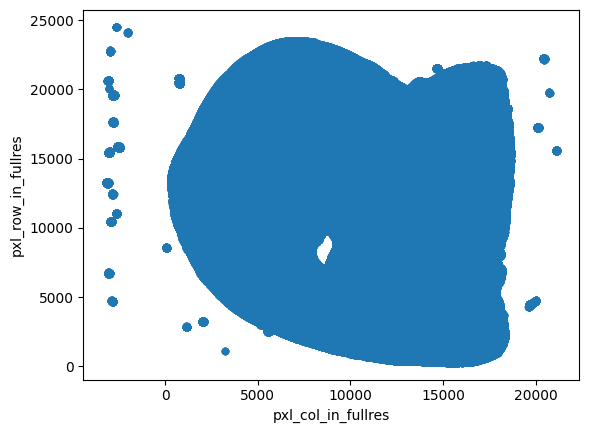

In [43]:
tissue_positions = pd.read_parquet(f"{path_data}/{dataset_name}/binned_outputs/square_00{bin_size}um/spatial/tissue_positions.parquet")

spots = tissue_positions[tissue_positions['in_tissue']==1]
spots.plot(kind='scatter', x='pxl_col_in_fullres', y='pxl_row_in_fullres')

In [44]:
spots.head()

,barcode,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
57735,s_002um_00017_00785-1,1,17,785,268.349734,15290.761184
57736,s_002um_00017_00786-1,1,17,786,268.459820,15283.462745
57737,s_002um_00017_00787-1,1,17,787,268.569906,15276.164305
57738,s_002um_00017_00788-1,1,17,788,268.679993,15268.865865
57739,s_002um_00017_00789-1,1,17,789,268.790079,15261.567426


In [45]:
spots.set_index('barcode', inplace=True)
spots.drop(['array_row','array_col'], axis=1, inplace=True)
spots.rename(columns={'pxl_row_in_fullres':"y",
                       'pxl_col_in_fullres':"x"}, inplace=True)
spots.head()

/var/folders/_6/bhs42vt57t1dkb59k4sy0p440000gp/T/ipykernel_42343/3160742075.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spots.drop(['array_row','array_col'], axis=1, inplace=True)
/var/folders/_6/bhs42vt57t1dkb59k4sy0p440000gp/T/ipykernel_42343/3160742075.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spots.rename(columns={'pxl_row_in_fullres':"y",


,in_tissue,y,x
barcode,,,
s_002um_00017_00785-1,1,268.349734,15290.761184
s_002um_00017_00786-1,1,268.459820,15283.462745
s_002um_00017_00787-1,1,268.569906,15276.164305
s_002um_00017_00788-1,1,268.679993,15268.865865
s_002um_00017_00789-1,1,268.790079,15261.567426


In [46]:
gene_str_to_int = dega.pre.boundary_tile._get_name_mapping(
    path_landscape_files,
    layer='transcript'
)

In [47]:
# Read spot-by-gene matrix

sbg = dega.pre.landscape.read_cbg_mtx(
    f"{path_data}/{dataset_name}/binned_outputs/square_00{bin_size}um/filtered_feature_bc_matrix", 
    technology=technology,
    barcodes_name='barcodes'
)

sbg = make_column_names_unique_fast(sbg)
sbg.head()

__index_level_0__,Xkr4,Rp1,Sox17,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,Rb1cc1,...,mt-Atp8,mt-Atp6,mt-Co3,mt-Nd3,mt-Nd4l,mt-Nd4,mt-Nd5,mt-Nd6,mt-Cytb,Vamp7
0,,,,,,,,,,,,,,,,,,,,,
s_002um_01022_01191-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
s_002um_00658_01498-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
s_002um_02449_02420-1,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
s_002um_01597_00975-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
s_002um_02587_02503-1,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,1,0,0,0,0


In [48]:
total_trx = sbg.sum(axis=0).sum()
print(f"Total transcripts: {total_trx/1e6:.1f}M")

Total transcripts: 89.2M


In [49]:
rng = np.random.default_rng()

out_dir = Path(path_landscape_files + '/transcript_tiles')
out_dir.mkdir(parents=True, exist_ok=True)

for i in range(n_tiles_x):
    if i % 10 == 0:
        print("row", i)

    for j in range(n_tiles_y):
        tile_x_min = tile_bounds["x_min"] + i * tile_size
        tile_x_max = tile_x_min + tile_size
        tile_y_min = tile_bounds["y_min"] + j * tile_size
        tile_y_max = tile_y_min + tile_size

        # Filter spot coordinates in this tile
        tile_spots = spots[
            (spots.x >= tile_x_min)
            & (spots.x < tile_x_max)
            & (spots.y >= tile_y_min)
            & (spots.y < tile_y_max)
        ]

        if tile_spots.empty:
            continue

        inst_spots = tile_spots.index.tolist()

        # Subset sparse matrix
        tile_sbg = sbg.loc[inst_spots]

        tile_sbg_coo = csr_matrix(tile_sbg.values)
        if tile_sbg_coo.nnz == 0:
            continue

        # Convert DataFrame → SciPy sparse
        coo = csr_matrix(tile_sbg.values).tocoo()
        row = np.array([inst_spots[r] for r in coo.row])
        col = tile_sbg.columns.to_numpy()[coo.col]
        count = coo.data

        # Create long format table with repeats
        df = pd.DataFrame({"spot": row, "gene": col, "count": count})
        df = df[df["count"] > 0]

        df = df.loc[df.index.repeat(df["count"].astype(int))].reset_index(drop=True)

        # Map spot → x, y
        df["x"] = df["spot"].map(tile_spots["x"])
        df["y"] = df["spot"].map(tile_spots["y"])

        # Map gene → int
        df["name"] = df["gene"].map(gene_str_to_int).astype("int32")

        # Convert to Polars for final processing
        pl_df = pl.DataFrame(df[["name", "x", "y"]])

        if rng is None:
            rng = np.random.default_rng()

        jitter_radius = jitter / 2
        jitter_x = rng.uniform(-jitter_radius, jitter_radius, size=len(pl_df))
        jitter_y = rng.uniform(-jitter_radius, jitter_radius, size=len(pl_df))

        pl_df = pl_df.with_columns(
            [
                (pl.col("x") + pl.Series(jitter_x)).round(2).alias("x"),
                (pl.col("y") + pl.Series(jitter_y)).round(2).alias("y"),
            ]
        )

        df_out = pl_df.to_pandas()
        df_out["geometry"] = df_out[["x", "y"]].values.tolist()
        filename = f"{path_landscape_files}/transcript_tiles/transcripts_tile_{i}_{j}.parquet"
        df_out[["name", "geometry"]].to_parquet(filename, index=False)

row 0
row 10
row 20
row 30


# Save Landscape Parameters

In [50]:
image_files_path = path_landscape_files + f"/pyramid_images/{image_tile_layer}_files"
root_dirs = [d for d in os.listdir(image_files_path) if os.path.isdir(os.path.join(image_files_path, d))]
max_pyramid_zoom = len(root_dirs)-1

In [51]:
landscape_parameters = {
  "technology": technology,
  "segmentation_approach": [
    "default"
  ],
  "max_pyramid_zoom": max_pyramid_zoom,
  "tile_size": tile_size,
  "image_info": [
    {
      "name": image_tile_layer,
      "button_name": image_tile_layer.upper(),
      "color": [
        0,
        0,
        255
      ]
    }
  ],
  "image_format": ".webp",
  "use_int_index": True
}

path = Path(f"{path_landscape_files}/landscape_parameters.json")
path.parent.mkdir(parents=True, exist_ok=True)

with path.open("w") as f:
    json.dump(landscape_parameters, f, indent=2)

# Viz

In [52]:
server_address = dega.viz.get_local_server()

## Initialize Heatmap

In [53]:
mat = dega.clust.Matrix(data=df_sig)
mat.norm(axis='row', by='zscore')
mat.cluster()
cgm = dega.viz.Clustergram(matrix=mat, width=500, height=500)

## Initialize Landscape

In [54]:
landscape_visium = dega.viz.Landscape(
    technology=technology,
    base_url=f"http://localhost:{server_address}/{path_landscape_files}",
    max_tiles_to_view=max_tiles_to_view
)

/var/folders/_6/bhs42vt57t1dkb59k4sy0p440000gp/T/ipykernel_42343/2117537559.py:1: UserWarning: Transformation matrix not found at http://localhost:50599/data/landscape_files/visium_hd_mouse_brain_2025-09-18_2um/micron_to_image_transform.csv. Using identity.
  landscape_visium = dega.viz.Landscape(


In [55]:
dega.viz.landscape_clustergram(landscape_visium, cgm)